In [101]:
%run ipy_setup.py
%matplotlib inline
pd.set_option('display.width', 900)
pd.set_option('display.max_columns', 100)
plt.style.use('ggplot')
rcParams['figure.figsize'] = (12, 8)
rcParams['figure.dpi'] = 150
rcParams['font.size'] = 16
rcParams['font.family'] = 'Helvetica Neue'

import lifelines as ll

set_matplotlib_formats("svg")
sb.set(font_scale=1)
pd.set_option('display.width', 400)
pd.set_option('display.max_rows', 200)
plt.style.use('ggplot')
rcParams['figure.figsize'] = (4,4)
rcParams['figure.dpi'] = 200
rcParams['font.size'] = 12
rcParams['font.family'] = 'Helvetica Neue'

COLOR = 'black'
rcParams['text.color'] = COLOR
rcParams['axes.labelcolor'] = COLOR
rcParams['xtick.color'] = COLOR
rcParams['ytick.color'] = COLOR

In [2]:
sample_info = pd.read_csv("../data_files/tcga_BRCA_survival.txt", sep="\t")
samp_info_2 = pd.read_csv("../data_files/nationwidechildrens.org_clinical_patient_brca.txt", sep="\t")

In [3]:
len(list(samp_info_2["death_days_to"][samp_info_2["death_days_to"] != "[Not Applicable]"]))

107

In [4]:
alive_or_dead = list(samp_info_2.vital_status)
list(samp_info_2.columns)

['bcr_patient_uuid',
 'bcr_patient_barcode',
 'form_completion_date',
 'prospective_collection',
 'retrospective_collection',
 'birth_days_to',
 'gender',
 'menopause_status',
 'race',
 'ethnicity',
 'history_other_malignancy',
 'history_neoadjuvant_treatment',
 'tumor_status',
 'vital_status',
 'last_contact_days_to',
 'death_days_to',
 'radiation_treatment_adjuvant',
 'pharmaceutical_tx_adjuvant',
 'histologic_diagnosis_other',
 'initial_pathologic_dx_year',
 'age_at_diagnosis',
 'method_initial_path_dx',
 'method_initial_path_dx_other',
 'surgical_procedure_first',
 'first_surgical_procedure_other',
 'margin_status',
 'surgery_for_positive_margins',
 'surgery_for_positive_margins_other',
 'margin_status_reexcision',
 'axillary_staging_method',
 'axillary_staging_method_other',
 'micromet_detection_by_ihc',
 'lymph_nodes_examined_count',
 'lymph_nodes_examined',
 'lymph_nodes_examined_he_count',
 'lymph_nodes_examined_ihc_count',
 'ajcc_staging_edition',
 'ajcc_tumor_pathologic_pt',


In [3]:
days_followed = []
patient_barcodes = []
alive_dead = []
for ix,i in samp_info_2.iterrows():
    if i.last_contact_days_to != "[Not Available]":
        if i.last_contact_days_to.isdigit():
            days_followed.append(int(i.last_contact_days_to))
            patient_barcodes.append(i.bcr_patient_barcode)
            alive_dead.append(1)
            continue
    elif i.death_days_to != "[Not Available]":
        if i.death_days_to.isdigit():
            days_followed.append(int(i.death_days_to))
            patient_barcodes.append(i.bcr_patient_barcode)
            alive_dead.append(0)
            continue

In [6]:
index = patient_barcodes
T = days_followed
C = alive_dead

from lifelines import KaplanMeierFitter
kmf = KaplanMeierFitter()
kmf.fit(T, event_observed=C )

<lifelines.KaplanMeierFitter: fitted with 1083 observations, 103 censored>

## KM LogRank test for Mutations and Survival

In [7]:
from lifelines.statistics import logrank_test

In [8]:
barcode_gene_status = pd.read_csv("TCGA_brca_sample_by_gene.tsv", sep="\t")

In [9]:
barcode_gene_status.set_index("Unnamed: 0", inplace=True)

,TCGA-E9-A2JT,TCGA-BH-A0W4,TCGA-A8-A07I,TCGA-AC-A3TM,TCGA-AC-A3TN,TCGA-AN-A0XL,TCGA-BH-A28Q,TCGA-A8-A07O,TCGA-AR-A24V,TCGA-A8-A07L,TCGA-AO-A03P,TCGA-A7-A0CH,TCGA-A7-A0CG,TCGA-A1-A0SQ,TCGA-A7-A0CE,TCGA-A7-A0CD,TCGA-AN-A0G0,TCGA-EW-A1P3,TCGA-AR-A1AT,TCGA-E2-A10E,TCGA-OL-A66I,TCGA-E9-A2JS,TCGA-AR-A1AS,TCGA-E2-A14N,TCGA-E2-A14O,TCGA-A8-A07U,TCGA-A7-A26I,TCGA-AC-A23E,TCGA-A8-A07Z,TCGA-AC-A23G,TCGA-E2-A14X,TCGA-E2-A14Y,TCGA-E2-A14Z,TCGA-BH-A18H,TCGA-E2-A14T,TCGA-E2-A14U,TCGA-E2-A14V,TCGA-E2-A14W,TCGA-E2-A14P,TCGA-AC-A23H,TCGA-E2-A14R,TCGA-E2-A14S,TCGA-AO-A03L,TCGA-D8-A3Z6,TCGA-D8-A3Z5,TCGA-A8-A097,TCGA-BH-A18L,TCGA-AN-A0FN,TCGA-A8-A099,TCGA-A8-A06Y,...,TCGA-A2-A04R,TCGA-BH-A0GY,TCGA-LQ-A4E4,TCGA-A2-A04W,TCGA-A2-A04V,TCGA-A2-A4RY,TCGA-A2-A4RX,TCGA-E2-A10F,TCGA-AR-A1AX,TCGA-AC-A3W7,TCGA-A2-A4RW,TCGA-BH-A0DD,TCGA-B6-A40B,TCGA-B6-A40C,TCGA-A8-A07B,TCGA-B6-A408,TCGA-A2-A3XZ,TCGA-A7-A26F,TCGA-A2-A0SY,TCGA-BH-A42U,TCGA-A7-A26E,TCGA-B6-A402,TCGA-A2-A0SU,TCGA-A7-A26H,TCGA-D8-A27V,TCGA-D8-A27P,TCGA-D8-A27R,TCGA-D8-A27M,TCGA-D8-A27L,TCGA-A7-A3J1,TCGA-D8-A27N,TCGA-D8-A27I,TCGA-D8-A27H,TCGA-D8-A27K,TCGA-D8-A27E,TCGA-BH-A18U,TCGA-D8-A27G,TCGA-D8-A27F,TCGA-BH-A18T,TCGA-LL-A5YP,TCGA-EW-A1P5,TCGA-AR-A1AV,TCGA-BH-A18V,TCGA-E9-A24A,TCGA-A8-A07J,TCGA-AQ-A1H3,TCGA-LL-A5YL,TCGA-LL-A5YM,TCGA-LL-A5YN,TCGA-LL-A5YO
MYCBP2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
barcode_gene_status.values.shape

(15582, 977)

In [22]:
results.p_value < 0.05

True

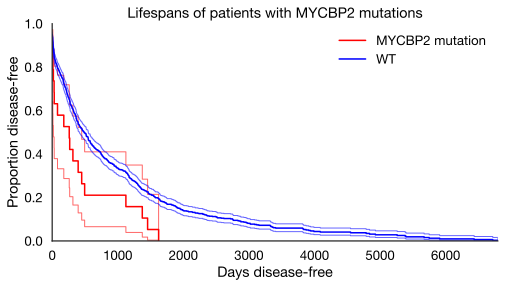

   test_statistic         p
0        7.152409  0.007486


In [31]:
set_matplotlib_formats("svg")
sb.set(font_scale=1.2)
pd.set_option('display.width', 400)
pd.set_option('display.max_rows', 200)
plt.style.use('seaborn-ticks')
rcParams['figure.figsize'] = (8,4)
rcParams['figure.dpi'] = 200
rcParams['font.size'] = 12
rcParams['font.family'] = 'Helvetica Neue'

COLOR = 'black'
rcParams['text.color'] = COLOR
rcParams['axes.labelcolor'] = COLOR
rcParams['xtick.color'] = COLOR
rcParams['ytick.color'] = COLOR

index = patient_barcodes
T = days_followed
C = alive_dead
pbar = ProgressBar(len(barcode_gene_status.index))
to_check = pd.DataFrame(barcode_gene_status.loc["MYCBP2",:]).T
significant_genes = []
for g_name, row in to_check.iterrows():
    pbar.animate()
    pos = list(row[row==1].keys())
    neg = list(row[row==0].keys())
    if len(pos) < 10: continue
    positive = [index.index(i) for i in pos if i in index]
    negative = [index.index(i) for i in neg if i in index]
    Tpos = [T[i] for i in positive]
    Cpos = [C[i] for i in positive]
    Tneg = [T[i] for i in negative]
    Cneg = [C[i] for i in negative]
    results = logrank_test(Tpos, Tneg, Cpos, Cneg, alpha=.99 )
    if results.p_value < 0.01:
        significant_genes.append((g_name, results.p_value, results.test_statistic, len(positive)))
        ax = plt.subplot(111)
        kmf = KaplanMeierFitter()
        kmf.fit(Tpos, event_observed=Cpos, label=str(g_name) + " mutation")
        kmf.plot(ax=ax, ci_force_lines=True,c="red")
        kmf.fit(Tneg, event_observed=Cneg, label="WT")
        kmf.plot(ax=ax, ci_force_lines=True, c="blue")
        plt.ylim(0,1);
        plt.title("Lifespans of patients with " + str(g_name) + " mutations");
        plt.xlabel("Days disease-free")
        plt.ylabel("Proportion disease-free")
        sb.despine(fig=plt.gcf())
        plt.show()
        print(results.summary)

In [130]:
sigdf = pd.DataFrame(significant_genes, columns=["gene", "p-value", "logRank_test_stat", "n"])
sigdf.sort('p-value')

/home/neffra/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  from ipykernel import kernelapp as app


,gene,p-value,logRank_test_stat,n
10,DNAJC13,5.859499e-07,24.957931,11
33,WNK1,2.781486e-06,21.961682,11
14,FAM5C,3.575358e-06,21.480013,12
17,KIAA1731,1.192393e-05,19.175414,12
15,HERC1,2.856350e-05,17.511101,15
19,MXRA5,4.397456e-05,16.691631,25
18,MUC19,4.750061e-05,16.545338,11
32,VPS13C,6.140256e-05,16.058893,19
16,ITSN2,1.411037e-04,14.487354,11
34,ZNF292,1.958901e-04,13.870102,12


In [ ]:
sigdf.to_csv("survival_mutational_anlysis_TCGA_breast.tsv", sep="\t")

## Cox PH model for RNA expression

In [4]:
index = patient_barcodes
T = days_followed
C = alive_dead
rna_expr = pd.read_csv("/sc/arion/projects/zhangb03a/neffr01/brca/tcga_BRCA_RNAseqV2_All.txt", sep="\t")
rna_expr.set_index("Symbol",inplace=True)
rna_expr = rna_expr.loc[["?"!=a for a in rna_expr.index],:]

In [5]:
rna_expr # normalized by age, already log scaled.

,TCGA-E9-A1RC,TCGA-BH-A0B1,TCGA-B6-A0RG,TCGA-D8-A1JH,TCGA-BH-A0DS,TCGA-A2-A0D1,TCGA-BH-A0HW,TCGA-A8-A08B,TCGA-A8-A07W,TCGA-AR-A2LK,TCGA-B6-A0WT,TCGA-AC-A23C,TCGA-E2-A1L9,TCGA-AO-A12F,TCGA-A8-A08G,TCGA-E2-A10F,TCGA-BH-A0B0,TCGA-BH-A1FU,TCGA-A2-A0SU,TCGA-E9-A1N6,TCGA-AR-A251,TCGA-D8-A1XU,TCGA-E9-A1NI,TCGA-BH-A1F5,TCGA-BH-A1FL,TCGA-GM-A2DN,TCGA-AC-A2BK,TCGA-A2-A04X,TCGA-AR-A0TX,TCGA-D8-A27T,TCGA-D8-A1JJ,TCGA-C8-A1HG,TCGA-A2-A0T4,TCGA-B6-A0I6,TCGA-A8-A099,TCGA-C8-A12L,TCGA-D8-A27F,TCGA-E9-A248,TCGA-A7-A0CH,TCGA-A8-A08L,TCGA-A8-A07O,TCGA-AO-A0JD,TCGA-EW-A1OY,TCGA-A7-A0DB,TCGA-D8-A1XQ,TCGA-A8-A07B,TCGA-AN-A0XL,TCGA-BH-A0DV,TCGA-BH-A0W3,TCGA-A1-A0SG,...,TCGA-A2-A0CL,TCGA-BH-A18F,TCGA-A2-A0D3,TCGA-AO-A03N,TCGA-C8-A12Y,TCGA-D8-A1XJ,TCGA-BH-A0EB,TCGA-A1-A0SP,TCGA-BH-A0HP,TCGA-A8-A09D,TCGA-D8-A1JD,TCGA-AR-A252,TCGA-A2-A0CT,TCGA-B6-A0IE,TCGA-A8-A09R,TCGA-C8-A138,TCGA-E9-A22B,TCGA-A2-A25C,TCGA-AO-A03M,TCGA-BH-A18U,TCGA-A8-A07F,TCGA-A8-A08O,TCGA-D8-A1JP,TCGA-B6-A0IJ,TCGA-E2-A1II,TCGA-D8-A1JK,TCGA-BH-A0H6,TCGA-E2-A14W,TCGA-BH-A0C0,TCGA-A8-A08P,TCGA-AR-A0TW,TCGA-C8-A274,TCGA-AR-A0TP,TCGA-A8-A09X,TCGA-AC-A2FF,TCGA-E2-A1BD,TCGA-E2-A1AZ,TCGA-E2-A1LI,TCGA-EW-A1PF,TCGA-BH-A0E0,TCGA-C8-A27B,TCGA-AO-A0JI,TCGA-A7-A13F,TCGA-AC-A2FB,TCGA-B6-A1KC,TCGA-BH-A0BT,TCGA-BH-A0DK,TCGA-AR-A1AH,TCGA-BH-A203,TCGA-D8-A1J9
Symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
A1BG,7.665951,7.694652,7.214151,6.591263,7.207917,7.267878,7.958392,4.160920,6.931063,6.523889,6.439428,7.203633,6.713146,6.255107,6.808903,6.477687,7.118993,5.306285,7.003954,6.780820,6.215564,8.019665,7.101701,6.805900,7.292781,5.769035,7.422195,5.818638,6.593270,6.366513,7.136057,8.155968,7.363349,5.721594,7.378336,6.588289,4.720274,6.087331,6.352476,6.702389,5.636273,5.357045,8.180560,8.055495,6.140151,6.318585,6.645853,6.957195,7.491147,7.136043,...,6.536422,6.112313,6.822757,7.548957,9.602341,6.073008,6.078804,4.274151,7.264876,6.641596,7.465431,5.412930,7.589554,8.060118,6.706099,7.953600,6.989328,6.605822,7.645029,6.596182,5.812144,6.642726,7.176375,7.461811,6.318355,7.031937,7.187288,7.141945,7.685957,6.572593,7.251056,7.485272,6.855946,5.357787,6.371962,8.444787,7.017991,7.119937,7.397926,6.046423,6.599678,7.124040,8.721516,6.616321,6.679312,7.679588,7.803891,7.409598,7.113664,5.430828
A1CF,0.049947,0.000963,-0.059969,-0.007281,0.004602,1.177364,-0.033417,2.199902,-0.066391,-0.069467,-0.041766,0.058096,0.038327,0.065009,-0.092665,-0.092520,0.016331,0.428177,0.078755,0.032676,-0.006350,0.457455,0.086033,0.035267,-0.012198,0.000627,0.054907,-0.072269,0.079808,0.062344,-0.062762,-0.023449,0.075844,0.383882,0.894979,0.567894,0.052885,0.034775,-0.020050,-0.056932,-0.084582,0.059100,-0.024693,0.651355,-0.051847,-0.067814,-0.066376,0.026642,-0.011738,0.070464,...,-0.015972,-0.025342,-0.012334,-0.039159,-0.020060,0.452832,-0.028324,0.138343,0.096505,-0.087493,-0.018196,-0.010713,-0.013876,-0.082707,-0.062025,0.024140,0.060861,-0.013221,-0.061455,-0.009334,-0.074395,-0.009477,0.005089,-0.079797,0.022611,0.017459,0.012606,0.068566,-0.001947,-0.070372,0.070005,0.117067,0.064527,-0.076194,0.032099,0.044982,0.650954,0.293157,-0.034153,-0.019026,0.116508,0.627298,0.000016,0.049707,0.117091,0.028097,-0.011407,-0.040585,0.025631,0.247945
A2BP1,0.102323,0.443294,1.100762,0.690216,-0.269322,0.088533,-0.158270,-0.023726,-0.189025,1.367619,-0.192285,0.339875,-0.007714,0.663468,0.676745,0.759534,1.283002,1.853088,1.842752,3.007573,0.362972,0.386853,1.020003,1.655569,-0.223112,0.141715,0.135461,0.371659,0.167914,-0.154994,0.587174,1.328394,0.102453,-0.037326,-0.188641,0.144647,-0.067360,0.501029,0.266090,0.175558,-0.020497,1.071666,1.652904,1.381264,0.082328,-0.138167,0.495197,1.754755,-0.204987,2.391743,...,1.701690,1.385470,0.411611,0.319445,1.508984,0.953464,0.670296,0.282325,3.706192,1.014772,0.037291,0.370519,0.641363,0.832694,5.374130,1.198311,0.001206,0.642714,1.057070,3.017344,1.707019,0.073447,2.502464,0.009862,-0.130919,-0.293023,1.212901,1.03

In [ ]:
ll.CoxPHFitter()

In [60]:
rna_expr

[903,
 518,
 474,
 730,
 558,
 48,
 592,
 201,
 192,
 443,
 488,
 250,
 860,
 366,
 204,
 799,
 517,
 642,
 66,
 883,
 435,
 761,
 628,
 638,
 994,
 255,
 30,
 392,
 781,
 732,
 687,
 75,
 457,
 224,
 664,
 771,
 924,
 127,
 208,
 187,
 348,
 953,
 131,
 757,
 179,
 318,
 560,
 596,
 12,
 169,
 334,
 477,
 798,
 892,
 663,
 538,
 347,
 554,
 795,
 897,
 714,
 759,
 969,
 96,
 773,
 830,
 679,
 851,
 215,
 921,
 174,
 321,
 190,
 360,
 9,
 955,
 247,
 478,
 482,
 223,
 779,
 646,
 180,
 822,
 459,
 882,
 43,
 909,
 176,
 394,
 694,
 89,
 124,
 797,
 377,
 147,
 316,
 916,
 341,
 260,
 777,
 371,
 292,
 981,
 951,
 324,
 494,
 365,
 532,
 46,
 872,
 456,
 571,
 673,
 486,
 914,
 51,
 251,
 754,
 322,
 731,
 801,
 94,
 11,
 253,
 389,
 927,
 637,
 69,
 429,
 308,
 310,
 430,
 139,
 840,
 49,
 537,
 524,
 899,
 126,
 745,
 484,
 772,
 971,
 444,
 611,
 683,
 634,
 423,
 97,
 849,
 767,
 344,
 841,
 472,
 674,
 910,
 92,
 197,
 911,
 195,
 680,
 755,
 682,
 70,
 230,
 543,
 37,
 304,
 88,
 

In [92]:
index = patient_barcodes
T = days_followed
C = alive_dead
pbar = ProgressBar(len(rna_expr.index))
significant_genes_rna = []
index_rna = [index.index(c) for c in rna_expr.columns if c in index]
T_rna = [T[i] for i in index_rna]
C_rna = [C[i] for i in index_rna]
for g_name, row in pd.DataFrame(rna_expr.loc["MYCBP2",:]).T.iterrows():
    pbar.animate()
    # need to match barcodes to T and C
    cx = ll.CoxPHFitter()
    dft = pd.DataFrame(zip(T_rna,C_rna,rna_expr.loc["MYCBP2",:] < np.quantile(rna_expr.loc["MYCBP2"],0.20)), columns=["duration", "death", "RNA"])
    cx.fit(df=dft, duration_col="duration", event_col="death", show_progress=False)
    significant_genes_rna.append([g_name, float(cx.summary.p), float(cx.summary["exp(coef)"])])

In [93]:
significant_genes_rna

[['MYCBP2', 0.09459339540599356, 0.8548722869609849]]

In [20]:
es = EnsemblRelease(75)
sig_rna_survival_pc = []
for ix, row in rna.iterrows():
    gene_type = row["gene"]
    try:
        if es.genes_by_name(gene_type)[0].biotype != "protein_coding" : continue
    except ValueError:
        continue
    sig_rna_survival_pc.append(row)
sig_rna_survival_pc = pd.DataFrame(sig_rna_survival_pc, columns=rna.columns)

In [21]:
sig_rna_survival_pc

,gene,p-value,exp(coef)
16200,MT-ND1,0.000002,0.769438
545,MSR1,0.000004,1.219538
10929,MICALL2,0.000007,1.316632
16353,FCGR3A,0.000010,1.213647
2186,RHBDD3,0.000013,1.345152
4890,KCNJ5,0.000014,1.233964
10338,FCGR3B,0.000014,1.125921
6715,SLC37A2,0.000015,1.210819
15492,C9orf163,0.000016,1.238329
373,SLC11A1,0.000018,1.200909


In [22]:
sig_rna_survival_pc.to_csv("TCGA_gene_expression_Cox_proportional_hazards_brca.tsv", sep="\t", index=None)

In [49]:
sig_rna_survival_pc = pd.read_csv("TCGA_gene_expression_Cox_proportional_hazards_brca.tsv", sep="\t")

In [50]:
sig_rna_survival_pc

,gene,p-value,exp(coef)
0,MT-ND1,0.000002,0.769438
1,MSR1,0.000004,1.219538
2,MICALL2,0.000007,1.316632
3,FCGR3A,0.000010,1.213647
4,RHBDD3,0.000013,1.345152
5,KCNJ5,0.000014,1.233964
6,FCGR3B,0.000014,1.125921
7,SLC37A2,0.000015,1.210819
8,C9orf163,0.000016,1.238329
9,SLC11A1,0.000018,1.200909


In [59]:
sig_rna_survival_pc[sig_rna_survival_pc["gene"]=="MYCBP2"]

,gene,p-value,exp(coef)


In [74]:
rna_expr.loc["MYCBP2",:] < np.quantile(rna_expr.loc["MYCBP2"],0.1)

TCGA-E9-A1RC      False
TCGA-BH-A0B1      False
TCGA-B6-A0RG      False
TCGA-D8-A1JH      False
TCGA-BH-A0DS      False
TCGA-A2-A0D1      False
TCGA-BH-A0HW      False
TCGA-A8-A08B      False
TCGA-A8-A07W      False
TCGA-AR-A2LK      False
TCGA-B6-A0WT      False
TCGA-AC-A23C      False
TCGA-E2-A1L9      False
TCGA-AO-A12F       True
TCGA-A8-A08G      False
TCGA-E2-A10F      False
TCGA-BH-A0B0      False
TCGA-BH-A1FU      False
TCGA-A2-A0SU      False
TCGA-E9-A1N6      False
TCGA-AR-A251      False
TCGA-D8-A1XU      False
TCGA-E9-A1NI      False
TCGA-BH-A1F5      False
TCGA-BH-A1FL       True
TCGA-GM-A2DN      False
TCGA-AC-A2BK       True
TCGA-A2-A04X       True
TCGA-AR-A0TX      False
TCGA-D8-A27T      False
TCGA-D8-A1JJ      False
TCGA-C8-A1HG      False
TCGA-A2-A0T4      False
TCGA-B6-A0I6      False
TCGA-A8-A099      False
TCGA-C8-A12L      False
TCGA-D8-A27F      False
TCGA-E9-A248      False
TCGA-A7-A0CH      False
TCGA-A8-A08L      False
TCGA-A8-A07O      False
TCGA-AO-A0JD    

In [6]:
def to_precision(x,p):
    """
    returns a string representation of x formatted with a precision of p

    Based on the webkit javascript implementation taken from here:
    https://code.google.com/p/webkit-mirror/source/browse/JavaScriptCore/kjs/number_object.cpp
    """

    x = float(x)

    if x == 0.:
        return "0." + "0"*(p-1)

    out = []

    if x < 0:
        out.append("-")
        x = -x

    e = int(math.log10(x))
    tens = math.pow(10, e - p + 1)
    n = math.floor(x/tens)

    if n < math.pow(10, p - 1):
        e = e -1
        tens = math.pow(10, e - p+1)
        n = math.floor(x / tens)

    if abs((n + 1.) * tens - x) <= abs(n * tens -x):
        n = n + 1

    if n >= math.pow(10,p):
        n = n / 10.
        e = e + 1

    m = "%.*g" % (p, n)

    if e < -2 or e >= p:
        out.append(m[0])
        if p > 1:
            out.append(".")
            out.extend(m[1:p])
        out.append('e')
        if e > 0:
            out.append("+")
        out.append(str(e))
    elif e == (p -1):
        out.append(m)
    elif e >= 0:
        out.append(m[:e+1])
        if e+1 < len(m):
            out.append(".")
            out.extend(m[e+1:])
    else:
        out.append("0.")
        out.extend(["0"]*-(e+1))
        out.append(m)

    return "".join(out)

In [ ]:
for line in spearmanr(rna_expr.loc[["MYCBP2","ATM","ATR","CHEK1","MTOR","TSC1","TSC2"],:].T).pvalue:
    for l in line:
        print(to_precision(l,2),end="\t")
    print()

In [106]:
for line in spearmanr(rppa.loc[["ATM","CHEK1","MTOR","TSC1","TSC2"],:].groupby(level=0, axis=0).mean().T).pvalue:
    for l in line:
        print(to_precision(l,2),end="\t")
    print()

0.0	2.5e-9	1.5e-14	1.2e-26	4.6e-9	
2.5e-9	0.0	0.056	2.1e-10	2.0e-19	
1.5e-14	0.056	0.0	1.3e-6	3.8e-36	
1.2e-26	2.1e-10	1.3e-6	0.0	3.4e-4	
4.6e-9	2.0e-19	3.8e-36	3.4e-4	0.0	


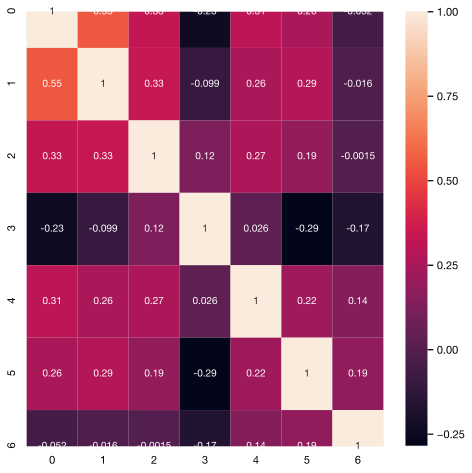

In [42]:
allg = ["MYCBP2","ATM", "ATR", "CHEK1", "MTOR","TSC1","TSC2" ]
spearmanr(rna_expr.loc[allg,:].T).correlation
sb.heatmap(spearmanr(rna_expr.loc[allg,:].T).correlation,annot=spearmanr(rna_expr.loc[allg,:].T).correlation)

In [54]:
rppa.index=[g.split("|")[0] for g in rppa.index]
rppa

,TCGA-EW-A2FR-01,TCGA-EW-A2FS-01,TCGA-EW-A2FW-01,TCGA-EW-A2FV-01,TCGA-EW-A1PC-01,TCGA-GM-A2DD-01,TCGA-A2-A0CK-01,TCGA-AC-A2BK-01,TCGA-AR-A2LO-01,TCGA-AR-A2LN-01,TCGA-AR-A2LQ-01,TCGA-AR-A2LH-01,TCGA-AR-A2LE-01,TCGA-GM-A2DL-01,TCGA-GM-A2DB-01,TCGA-GM-A2DH-01,TCGA-GM-A2DN-01,TCGA-GM-A2DM-01,TCGA-GM-A2DC-01,TCGA-GM-A2DI-01,TCGA-GM-A2DF-01,TCGA-AR-A1AM-01,TCGA-GM-A2D9-01,TCGA-GM-A2DO-01,TCGA-GM-A2DK-01,TCGA-AR-A2LK-01,TCGA-AR-A2LM-01,TCGA-B6-A2IU-01,TCGA-A2-A0CR-01,TCGA-E9-A2JT-01,TCGA-A7-A2KD-01,TCGA-E2-A1LE-01,TCGA-E2-A2P5-01,TCGA-BH-A2L8-01,TCGA-AC-A2FM-01,TCGA-AC-A2FF-01,TCGA-AC-A2FG-01,TCGA-AC-A2FE-01,TCGA-AC-A2FB-01,TCGA-GI-A2C9-01,TCGA-D8-A27V-01,TCGA-AC-A2B8-01,TCGA-AC-A2BM-01,TCGA-HN-A2NL-01,TCGA-AC-A2QI-01,TCGA-AC-A2QJ-01,TCGA-E2-A3DX-01,TCGA-E9-A3HO-01,TCGA-C8-A3M7-01,TCGA-A7-A3J1-01,...,TCGA-Z7-A8R6-01,TCGA-LL-A73Z-01,TCGA-LL-A740-01,TCGA-C8-A8HP-01,TCGA-C8-A8HQ-01,TCGA-C8-A8HR-01,TCGA-S3-AA14-01,TCGA-S3-AA15-01,TCGA-BH-A8FZ-01,TCGA-S3-AA17-01,TCGA-BH-A8G0-01,TCGA-UU-A93S-01,TCGA-Z7-A8R5-01,TCGA-C8-A9FZ-01,TCGA-S3-AA12-01,TCGA-LD-A9QF-01,TCGA-S3-AA0Z-01,TCGA-S3-AA11-01,TCGA-S3-AA10-01,TCGA-AC-A6NO-01,TCGA-BH-A6R8-01,TCGA-UL-AAZ6-01,TCGA-LL-A7SZ-01,TCGA-AQ-A7U7-01,TCGA-LL-A9Q3-01,TCGA-AC-A8OQ-01,TCGA-BH-A8FY-01,TCGA-PL-A8LV-01,TCGA-PL-A8LY-01,TCGA-PL-A8LX-01,TCGA-W8-A86G-01,TCGA-LD-A7W6-01,TCGA-XX-A899-01,TCGA-LL-A8F5-01,TCGA-LD-A7W5-01,TCGA-S3-A6ZG-01,TCGA-S3-A6ZH-01,TCGA-AC-A6IW-01,TCGA-EW-A6S9-01,TCGA-AC-A4ZE-01,TCGA-EW-A6SA-01,TCGA-OL-A6VO-01,TCGA-OL-A6VQ-01,TCGA-A7-A6VV-01,TCGA-A7-A6VX-01,TCGA-D8-A73W-01,TCGA-BH-A6R9-01,TCGA-EW-A6SD-01,TCGA-EW-A6SB-01,TCGA-EW-A6SC-01
YWHAE,-0.933958,-1.075068,-0.736280,-1.021079,-0.841824,-0.464093,-0.855925,-0.868970,-0.603828,-0.654610,-0.385400,-0.785473,-0.097143,-0.754467,-0.780049,-0.918952,-0.914024,-0.616177,-0.795658,-0.845133,-0.770506,-0.575369,-0.743691,-0.778112,-0.563520,-0.926448,-0.584422,-0.759621,-0.705751,-0.768683,-0.945589,-0.694932,-0.687946,-1.009940,-0.784133,-0.747705,-0.726140,-0.680185,-0.509540,-0.541361,-0.641027,-0.796322,-0.896441,-0.792882,-0.809559,-0.891430,-0.637947,-0.729100,-0.533249,-0.796658,...,-1.041784,-1.197598,-1.429933,-0.864737,-0.800240,-1.028697,-1.174485,-0.812008,-1.173633,-0.887005,-0.972255,-0.902396,-1.146513,-0.812090,-0.891799,-0.971289,-0.861629,-0.971661,-0.809712,-0.910713,-1.020667,-0.886845,-1.061291,-0.912370,-0.920969,-1.744746,-0.991562,-0.908495,-0.673587,-0.684753,-1.013967,-1.202306,-0.914065,-1.035372,-1.011645,-1.163475,-0.695035,-1.092179,-1.319046,-0.849550,-1.101814,-0.853882,-1.015141,-1.118667,-0.917514,-1.183985,-1.178910,-1.304363,-0.673711,-1.259361
EIF4EBP1,1.527211,-0.542746,0.006447,-0.384184,0.375903,0.085844,-0.033401,0.975474,-0.122900,-0.295959,-0.164987,0.117247,-0.545004,0.257864,0.320712,0.179741,-0.108046,0.276294,0.572707,-0.112858,1.100798,-0.462642,0.317851,1.043880,-0.011974,0.379215,0.052280,0.074604,-0.176590,0.240456,-0.168152,0.282505,0.349646,0.081060,0.310307,-0.163232,0.252364,0.307066,-0.609447,0.706833,0.316855,0.401361,0.725543,0.000000,-0.304298,0.343194,-0.282626,0.555988,0.453325,-0.294284,...,0.389841,-0.347313,-0.112013,-0.534667,-0.235306,0.064527,-0.351956,-0.364395,-0.383897,0.987734,-1.045667,1.319499,0.655847,1.945217,1.999826,0.017985,0.171360,0.083535,1.805300,0.148289,-1.373731,0.737294,0.323172,-0.405409,0.642279,-1.082353,0.783739,-0.596699,-0.534742,0.248436,0.877046,1.904811,0.987622,-0.111455,-0.227926,0.299008,2.063266,0.303363,-0.225198,0.405008,-1.496223,1.037750,-0.705147,0.374482,0.202040,0.255406,0.123704,0.433854,0.545890,-0.809460
EIF4EBP1,0.186579,-0.055207,-0.158695,-0.501670,-0.137597,0.115947,-0.389268,0.233312,-0.262738,-0.313933,-0.197044,-0.187825,0.261108,-0.179841,0.080044,0.077227,-0.270588,-0.176200,-0.283080,-0.044455,0.140984,-0.168362,0.132025,-0.138931,-0.183001,-0.293551,-0.285679,-0.087173,-0.217040,0.405717,-0.227705,0.092576,-0.033275,0.000000,-0.080375,-0.134240,-0.246887,-0.224043,-0.003956,-0.004725,-0.236526,-0.085030,-0.280257,-0.1241

In [102]:
rcParams['figure.figsize'] = (8,8)
out = pd.plotting.scatter_matrix(rna_expr.loc[["MYCBP2","ATR","ATM","CHEK1","MTOR","TSC1","TSC2"],:].T,diagonal="kde")

plt.gcf().savefig("mycbp2_genes_scatter_matrix.pdf")
plt.show()

In [74]:
rcParams['figure.figsize'] = (8,8)
out = pd.plotting.scatter_matrix(rppa.loc[["ATM","CHEK1","MTOR","TSC1","TSC2"],:].groupby(level=0, axis=0).mean().T,diagonal="kde",c="b")

plt.gcf().savefig("mycbp2_proteins_scatter_matrix.pdf")
plt.show()

In [73]:
spearmapr(rppa.loc[["ATM","CHEK1","MTOR","TSC1","TSC2"],:].groupby(level=0, axis=0).mean())

,TCGA-EW-A2FR-01,TCGA-EW-A2FS-01,TCGA-EW-A2FW-01,TCGA-EW-A2FV-01,TCGA-EW-A1PC-01,TCGA-GM-A2DD-01,TCGA-A2-A0CK-01,TCGA-AC-A2BK-01,TCGA-AR-A2LO-01,TCGA-AR-A2LN-01,TCGA-AR-A2LQ-01,TCGA-AR-A2LH-01,TCGA-AR-A2LE-01,TCGA-GM-A2DL-01,TCGA-GM-A2DB-01,TCGA-GM-A2DH-01,TCGA-GM-A2DN-01,TCGA-GM-A2DM-01,TCGA-GM-A2DC-01,TCGA-GM-A2DI-01,TCGA-GM-A2DF-01,TCGA-AR-A1AM-01,TCGA-GM-A2D9-01,TCGA-GM-A2DO-01,TCGA-GM-A2DK-01,TCGA-AR-A2LK-01,TCGA-AR-A2LM-01,TCGA-B6-A2IU-01,TCGA-A2-A0CR-01,TCGA-E9-A2JT-01,TCGA-A7-A2KD-01,TCGA-E2-A1LE-01,TCGA-E2-A2P5-01,TCGA-BH-A2L8-01,TCGA-AC-A2FM-01,TCGA-AC-A2FF-01,TCGA-AC-A2FG-01,TCGA-AC-A2FE-01,TCGA-AC-A2FB-01,TCGA-GI-A2C9-01,TCGA-D8-A27V-01,TCGA-AC-A2B8-01,TCGA-AC-A2BM-01,TCGA-HN-A2NL-01,TCGA-AC-A2QI-01,TCGA-AC-A2QJ-01,TCGA-E2-A3DX-01,TCGA-E9-A3HO-01,TCGA-C8-A3M7-01,TCGA-A7-A3J1-01,...,TCGA-Z7-A8R6-01,TCGA-LL-A73Z-01,TCGA-LL-A740-01,TCGA-C8-A8HP-01,TCGA-C8-A8HQ-01,TCGA-C8-A8HR-01,TCGA-S3-AA14-01,TCGA-S3-AA15-01,TCGA-BH-A8FZ-01,TCGA-S3-AA17-01,TCGA-BH-A8G0-01,TCGA-UU-A93S-01,TCGA-Z7-A8R5-01,TCGA-C8-A9FZ-01,TCGA-S3-AA12-01,TCGA-LD-A9QF-01,TCGA-S3-AA0Z-01,TCGA-S3-AA11-01,TCGA-S3-AA10-01,TCGA-AC-A6NO-01,TCGA-BH-A6R8-01,TCGA-UL-AAZ6-01,TCGA-LL-A7SZ-01,TCGA-AQ-A7U7-01,TCGA-LL-A9Q3-01,TCGA-AC-A8OQ-01,TCGA-BH-A8FY-01,TCGA-PL-A8LV-01,TCGA-PL-A8LY-01,TCGA-PL-A8LX-01,TCGA-W8-A86G-01,TCGA-LD-A7W6-01,TCGA-XX-A899-01,TCGA-LL-A8F5-01,TCGA-LD-A7W5-01,TCGA-S3-A6ZG-01,TCGA-S3-A6ZH-01,TCGA-AC-A6IW-01,TCGA-EW-A6S9-01,TCGA-AC-A4ZE-01,TCGA-EW-A6SA-01,TCGA-OL-A6VO-01,TCGA-OL-A6VQ-01,TCGA-A7-A6VV-01,TCGA-A7-A6VX-01,TCGA-D8-A73W-01,TCGA-BH-A6R9-01,TCGA-EW-A6SD-01,TCGA-EW-A6SB-01,TCGA-EW-A6SC-01
ATM,2.285960,1.956849,1.676592,2.049672,1.721576,2.119694,1.872208,2.142005,2.225978,1.167876,1.694106,2.697645,0.780568,2.322480,3.031583,2.384143,2.655875,2.611582,2.682282,3.190428,2.706709,2.137997,2.053792,3.642032,3.326283,1.887109,3.042438,2.771123,3.185724,2.490123,2.929700,2.030974,1.990135,2.626045,1.163979,2.180275,1.527937,2.507756,1.819572,2.264526,0.827208,1.933787,1.996974,1.883419,1.277108,2.832350,2.893767,2.260715,1.724388,1.648022,...,2.251807,3.500825,3.453683,4.397134,2.925324,2.904843,2.932003,-0.739578,2.624266,3.812930,3.234346,3.175555,2.620078,1.935991,2.752832,3.607329,2.260732,2.587277,3.485864,3.148036,3.194825,2.409549,3.159948,2.460584,2.474491,4.548377,3.388043,3.218809,3.349432,2.973099,0.636635,2.760975,2.335887,1.910375,1.223180,3.204986,2.765519,3.888545,2.534337,1.904616,0.921851,3.027225,3.241593,3.675712,2.879182,2.713318,2.744118,2.904224,3.484566,2.269459
CHEK1,-0.495843,-0.362745,-0.575129,-0.528626,-0.420629,-0.376021,-0.415227,-0.276537,-0.531113,-0.604133,-0.444526,-0.355369,0.228723,-0.517270,-0.227470,-0.379932,-0.480965,-0.469277,-0.475918,-0.495077,-0.551312,-0.543080,-0.457125,-0.402008,-0.446779,-0.519249,-0.570484,-0.335274,-0.411923,-0.591622,-0.533215,-0.332024,-0.508983,-0.554043,-0.620963,-0.243824,-0.619662,-0.637275,-0.164463,-0.249185,-0.429465,-0.726674,-0.628638,-0.376686,-0.310266,-0.193568,-0.224595,-0.411637,-0.140104,-0.662435,...,-0.679906,-1.343494,-1.657104,-1.131690,-0.723290,-0.930611,-1.203473,-1.008475,-1.370447,-0.891924,-1.422553,-0.766136,-1.298394,-0.585966,-0.964637,-1.006696,-0.596199,-1.168410,-0.504118,-0.719156,-1.621347,-0.605849,-1.002620,-1.158928,-1.209829,-1.155453,-0.823175,-1.451902,-0.960184,-0.735055,-0.510538,-1.391685,-0.891501,-0.849956,-1.147228,-1.025313,-0.958337,-0.709597,-1.477261,-0.587407,-0.300765,-0.571230,-1.329107,-0.702752,-0.833125,-0.894526,-1.151257,-1.697236,-0.513869,-1.656757
MTOR,0.110524,0.475653,0.303169,0.236907,0.540943,0.350528,0.100324,-0.050741,0.308506,0.281073,0.193938,0.017540,-0.304285,0.297124,0.368862,0.225445,0.200682,0.421682,0.426811,0.338958,0.065522,0.138277,0.465471,0.554717,0.527321,0.137803,0.656397,0.318210,0.178358,0.112378,0.216288,0.256862,0.205733,0.253386,0.304502,0.187193,0.072106,0.127155,0.091918,0.373207,0.229137,0.101941,0.164169,0.161823,0.392818,0.498647,0.173684,0.159605,0.050191,0.303873,...,0.442913,-0.6276

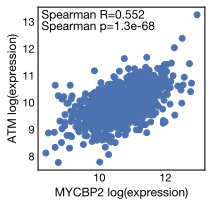

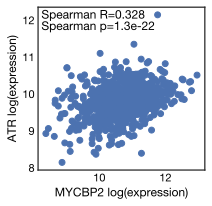

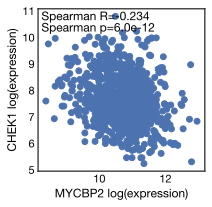

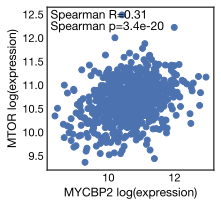

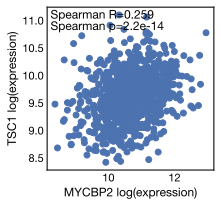

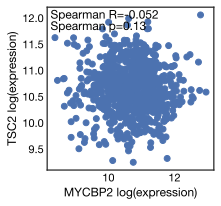

In [16]:
from scipy.stats import spearmanr

set_matplotlib_formats("svg")
sb.set(font_scale=1)
pd.set_option('display.width', 400)
pd.set_option('display.max_rows', 200)
plt.style.use('seaborn-white')
rcParams['figure.figsize'] = (3,3)
rcParams['figure.dpi'] = 200
rcParams['font.size'] = 12
rcParams['font.family'] = 'Helvetica Neue'

COLOR = 'black'
rcParams['text.color'] = COLOR
rcParams['axes.labelcolor'] = COLOR
rcParams['xtick.color'] = COLOR
rcParams['ytick.color'] = COLOR

others = ["ATM", "ATR", "CHEK1", "MTOR","TSC1","TSC2" ]

for gene2 in others:
    gene1 = "MYCBP2"

    plt.scatter(rna_expr.loc[gene1,:],rna_expr.loc[gene2,:])
    #sb.despine(fig=plt.gcf())

    plt.xlabel(gene1+" log(expression)")
    plt.ylabel(gene2 + " log(expression)")
    corr = spearmanr(rna_expr.loc[gene1,:],rna_expr.loc[gene2,:],)[0]
    pval = spearmanr(rna_expr.loc[gene1,:],rna_expr.loc[gene2,:],)[1]
    plt.text(0.02,0.93,"Spearman R="+str(round(corr,3)),transform = plt.gca().transAxes)
    plt.text(0.02,0.86,"Spearman p="+to_precision(pval,2),transform = plt.gca().transAxes)
    plt.show()




In [10]:
spearmanr(rna_expr.loc[gene1,:],rna_expr.loc[gene2,:],)

SpearmanrResult(correlation=0.026146339301922648, pvalue=0.4480924939113867)

In [55]:
rppa = pd.read_csv("/sc/arion/projects/zhangb03a/neffr01/brca/protein/data_rppa.txt",sep="\t",index_col=0)
rppa.index=[g.split("|")[0] for g in rppa.index]

In [59]:
rppa.index[7]

'AKT1 AKT2 AKT3'

In [161]:
corr.

SpearmanrResult(correlation=-0.29315146085114696, pvalue=8.03993724068939e-19)

In [89]:
rppa.loc[loc1,:].median()

TCGA-EW-A2FR-01   -0.495843
TCGA-EW-A2FS-01   -0.362745
TCGA-EW-A2FW-01   -0.575129
TCGA-EW-A2FV-01   -0.528626
TCGA-EW-A1PC-01   -0.420629
TCGA-GM-A2DD-01   -0.376021
TCGA-A2-A0CK-01   -0.415227
TCGA-AC-A2BK-01   -0.276537
TCGA-AR-A2LO-01   -0.531113
TCGA-AR-A2LN-01   -0.604133
TCGA-AR-A2LQ-01   -0.444526
TCGA-AR-A2LH-01   -0.355369
TCGA-AR-A2LE-01    0.228723
TCGA-GM-A2DL-01   -0.517270
TCGA-GM-A2DB-01   -0.227470
TCGA-GM-A2DH-01   -0.379932
TCGA-GM-A2DN-01   -0.480965
TCGA-GM-A2DM-01   -0.469277
TCGA-GM-A2DC-01   -0.475918
TCGA-GM-A2DI-01   -0.495077
TCGA-GM-A2DF-01   -0.551312
TCGA-AR-A1AM-01   -0.543080
TCGA-GM-A2D9-01   -0.457125
TCGA-GM-A2DO-01   -0.402008
TCGA-GM-A2DK-01   -0.446779
TCGA-AR-A2LK-01   -0.519249
TCGA-AR-A2LM-01   -0.570484
TCGA-B6-A2IU-01   -0.335274
TCGA-A2-A0CR-01   -0.411923
TCGA-E9-A2JT-01   -0.591622
TCGA-A7-A2KD-01   -0.533215
TCGA-E2-A1LE-01   -0.332024
TCGA-E2-A2P5-01   -0.508983
TCGA-BH-A2L8-01   -0.554043
TCGA-AC-A2FM-01   -0.620963
TCGA-AC-A2FF-01   -0

In [97]:
rppa.loc[gene2,:]

TCGA-EW-A2FR-01    2.285960
TCGA-EW-A2FS-01    1.956849
TCGA-EW-A2FW-01    1.676592
TCGA-EW-A2FV-01    2.049672
TCGA-EW-A1PC-01    1.721576
TCGA-GM-A2DD-01    2.119694
TCGA-A2-A0CK-01    1.872208
TCGA-AC-A2BK-01    2.142005
TCGA-AR-A2LO-01    2.225978
TCGA-AR-A2LN-01    1.167876
TCGA-AR-A2LQ-01    1.694106
TCGA-AR-A2LH-01    2.697645
TCGA-AR-A2LE-01    0.780568
TCGA-GM-A2DL-01    2.322480
TCGA-GM-A2DB-01    3.031583
TCGA-GM-A2DH-01    2.384143
TCGA-GM-A2DN-01    2.655875
TCGA-GM-A2DM-01    2.611582
TCGA-GM-A2DC-01    2.682282
TCGA-GM-A2DI-01    3.190428
TCGA-GM-A2DF-01    2.706709
TCGA-AR-A1AM-01    2.137997
TCGA-GM-A2D9-01    2.053792
TCGA-GM-A2DO-01    3.642032
TCGA-GM-A2DK-01    3.326283
TCGA-AR-A2LK-01    1.887109
TCGA-AR-A2LM-01    3.042438
TCGA-B6-A2IU-01    2.771123
TCGA-A2-A0CR-01    3.185724
TCGA-E9-A2JT-01    2.490123
TCGA-A7-A2KD-01    2.929700
TCGA-E2-A1LE-01    2.030974
TCGA-E2-A2P5-01    1.990135
TCGA-BH-A2L8-01    2.626045
TCGA-AC-A2FM-01    1.163979
TCGA-AC-A2FF-01    2

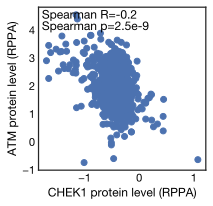

In [99]:
from scipy.stats import spearmanr

set_matplotlib_formats("svg")
sb.set(font_scale=1)
pd.set_option('display.width', 400)
pd.set_option('display.max_rows', 200)
plt.style.use('seaborn-white')
rcParams['figure.figsize'] = (3,3)
rcParams['figure.dpi'] = 200
rcParams['font.size'] = 12
rcParams['font.family'] = 'Helvetica Neue'

COLOR = 'black'
rcParams['text.color'] = COLOR
rcParams['axes.labelcolor'] = COLOR
rcParams['xtick.color'] = COLOR
rcParams['ytick.color'] = COLOR

gene1 = "CHEK1"
gene2 = "ATM"

loc1 = sorted([i for i in rppa.index if gene1 in i],key=lambda x:len(x))[0]
loc2 = sorted([i for i in rppa.index if gene2 in i],key=lambda x:len(x))[0]

plt.scatter(rppa.loc[gene1,:].mean(),rppa.loc[gene2,:])
#sb.despine(fig=plt.gcf())

plt.xlabel(gene1+" protein level (RPPA)")
plt.ylabel(gene2 + " protein level (RPPA)")
corr = sp.stats.spearmanr(rppa.loc[loc1,:].mean(),rppa.loc[loc2,:]).correlation
pval = sp.stats.spearmanr(rppa.loc[loc1,:].mean(),rppa.loc[loc2,:]).pvalue

plt.text(0.02,0.93,"Spearman R="+str(round(corr,3)),transform = plt.gca().transAxes)
plt.text(0.02,0.86,"Spearman p="+to_precision(pval,2),transform = plt.gca().transAxes)
    
plt.show()

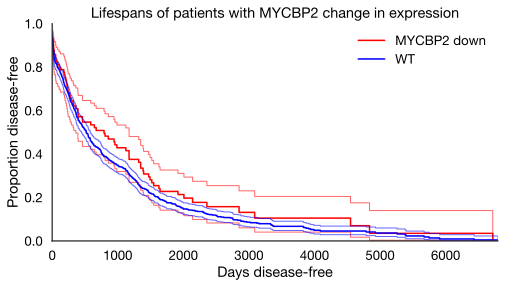

   test_statistic         p
0        2.188931  0.139006


In [110]:
rna = pd.DataFrame(significant_genes_rna, columns=["gene", "p-value", "exp(coef)"])
rna = rna.sort_values("p-value", ascending=True)
index_rna = [index.index(c) for c in rna_expr.columns if c in index]
T_rna = [T[i] for i in index_rna]
C_rna = [C[i] for i in index_rna]
for ix, rrow in rna.sort_values("p-value").iterrows():
    row = rna_expr.loc[rrow["gene"]]
    g_name = rrow["gene"]
    cx = ll.CoxPHFitter()
    dft = pd.DataFrame(zip(T_rna,C_rna,rna_expr.loc["MYCBP2",:] < np.quantile(rna_expr.loc["MYCBP2"],0.10)), columns=["duration", "death", "RNA"])
    cx.fit(df=dft, duration_col="duration", event_col="death", show_progress=False)
    median = np.median(row)
    pos = list(row[rna_expr.loc["MYCBP2",:] < np.quantile(rna_expr.loc["MYCBP2"],0.10)].keys())
    neg = list(row[rna_expr.loc["MYCBP2",:] >= np.quantile(rna_expr.loc["MYCBP2"],0.10)].keys())
    positive = [index.index(i) for i in pos if i in index]
    negative = [index.index(i) for i in neg if i in index]
    Tpos = [T[i] for i in positive]
    Cpos = [C[i] for i in positive]
    Tneg = [T[i] for i in negative]
    Cneg = [C[i] for i in negative]
    results = logrank_test(Tpos, Tneg, Cpos, Cneg, alpha=.99 )
    if results.p_value < 1:
        significant_genes.append((g_name, results.p_value, results.test_statistic, len(positive)))
        ax = plt.subplot(111)
        kmf = KaplanMeierFitter()
        kmf.fit(Tpos, event_observed=Cpos, label=str(g_name) + " down")
        kmf.plot(ax=ax, ci_force_lines=True,c="red")
        kmf.fit(Tneg, event_observed=Cneg, label="WT")
        kmf.plot(ax=ax, ci_force_lines=True,c="blue")
        plt.ylim(0,1);
        plt.title("Lifespans of patients with " + str(g_name) + " change in expression");
        sb.despine(fig=plt.gcf())
        plt.xlabel("Days disease-free")
        plt.ylabel("Proportion disease-free")
        plt.show()
        print(results.summary)